In [20]:
import cv2
import xml.etree.ElementTree as ET
import numpy as np
import os
from torch.utils.data import DataLoader
from torchvision import models, transforms
from torch import nn
import torch
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os
import torch
import torch.nn as nn
from torchvision import models, transforms
from torch.utils.data import DataLoader
from torch.utils.data import Dataset

# Function for cropping images from XML Files

In [46]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET

def crop_images(image_path, xml_path):
    
    '''This function takes the path to the image and the path to the XML-File and returns the resulting cropped
    images as a numpy array that is in the BGR-Format'''
    
    # Bild laden
    image = cv2.imread(image_path)

    # XML-Datei analysieren
    tree = ET.parse(xml_path)
    root = tree.getroot()

    # Leeres Array für die ausgeschnittenen Boxen
    to_classify = []

    # Kopiere das Originalbild für die Anzeige der Boxen
    image_with_boxes = image.copy()

    # Iteriere durch jede Box im XML
    for space in root.iter('space'):
        # Extrahiere Koordinaten und Winkel aus XML (Konturkoordinaten)
        contour_points = []
        for point in space.iter('point'):
            x = int(point.attrib['x'])
            y = int(point.attrib['y'])
            contour_points.append((x, y))

        # Konvertiere die Konturpunkte in ein NumPy-Array
        contour_np = np.array(contour_points, dtype=np.int32)
        contour_np = contour_np.reshape((-1, 1, 2))

        # Zeichne ein Rechteck um die Konturpunkte auf dem Bild mit Boxen
        cv2.polylines(image_with_boxes, [contour_np], isClosed=True, color=(0, 255, 0), thickness=2)

        # Extrahiere Winkel aus XML
        angle = float(space.find('./rotatedRect/angle').attrib['d'])

        # Extrahiere Zentrum aus XML
        center_x = float(space.find('./rotatedRect/center').attrib['x'])
        center_y = float(space.find('./rotatedRect/center').attrib['y'])
        center = (center_x, center_y)

        # Berechne die Rotationsmatrix
        rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)

        # Rotiere das Bild
        rotated_image = cv2.warpAffine(image, rotation_matrix, (image.shape[1], image.shape[0]))

        # Schneide die Box aus dem rotierten Bild aus
        rect = cv2.boundingRect(contour_np)
        box_image = rotated_image[rect[1]:rect[1] + rect[3], rect[0]:rect[0] + rect[2]]

        # Füge die ausgeschnittene Box zur Liste hinzu
        to_classify.append(box_image)

    # Anzeigen des Bildes mit den eingezeichneten Boxen im Output
    plt.imshow(cv2.cvtColor(image_with_boxes, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    return to_classify

### To check, how the photos that were cropped look

In [ ]:
def display_images(images, titles=None, cmap=None):
    """
    Display a list of images in a single figure with matplotlib.

    Parameters:
        images (list): List of images (NumPy arrays).
        titles (list): List of titles for each image. If None, no titles will be shown.
        cmap (str): Colormap to be used with matplotlib's `imshow`. If None, default colormap is used.
    """
    num_images = len(images)

    if titles is None:
        titles = [''] * num_images

    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

    for i in range(num_images):
        axes[i].imshow(images[i], cmap=cmap)
        axes[i].axis('off')
        axes[i].set_title(titles[i])

    plt.show()

# Function for the classification of a parking lot

In [73]:
def classify_parkinglot(to_classify, model_path):
    
    '''This function takes the output of the function 'crop_images' (or any other numpy array of photos), converts
    them to RGB if necessary and returns the total number of parking spaces and of this the number of 
    empty and occupied spaces.'''


    # Determine the number of parking spaces in a parking lot
    num_parking_spaces = len(to_classify)

    ## Classify single parking spaces
    
    # Load model for classification
    loaded_model = models.resnet18()
    loaded_model.fc = nn.Linear(loaded_model.fc.in_features, 2)  # 2 Classes (Empty, Occupied)
    loaded_model.load_state_dict(torch.load(model_path))
    loaded_model.eval()

    # Data transformation for new dataset
    data_transform = transforms.Compose([
        transforms.Resize((128, 128), interpolation=Image.BICUBIC),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
    ])

    # Apply transformations to each image in to_classify
    # It is important to highlight that a picture that already has RGB format will not be affected by cv2.COLOR_BGR2RGB

    to_classify_transformed = [data_transform(Image.fromarray(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))) for img in to_classify]

    # Convert the transformed images to a PyTorch tensor
    to_classify_tensor = torch.stack(to_classify_transformed)

    # Create a dataset from to_classify
    dataset = torch.utils.data.TensorDataset(to_classify_tensor)

    # Create data loader for the dataset
    data_loader = DataLoader(dataset, batch_size=32, shuffle=False)

    # Classify and count parking spaces
    num_empty_spaces = 0
    num_occupied_spaces = 0

    with torch.no_grad():
        for inputs in data_loader:
            outputs = loaded_model(inputs[0])  # Unpack the input from the batch
            _, predictions = torch.max(outputs, 1)
            
            # Count empty and occupied parking spaces
            num_empty_spaces += (predictions == 0).sum().item()
            num_occupied_spaces += (predictions == 1).sum().item()

    print(f'Number of parking spaces: {num_parking_spaces}\nNumber of empty spaces: {num_empty_spaces}\nNumber of occupied spaces: {num_occupied_spaces}')
            
    # Add an ID to a parking lot and give back a list of boxes


    return num_parking_spaces, num_empty_spaces, num_occupied_spaces

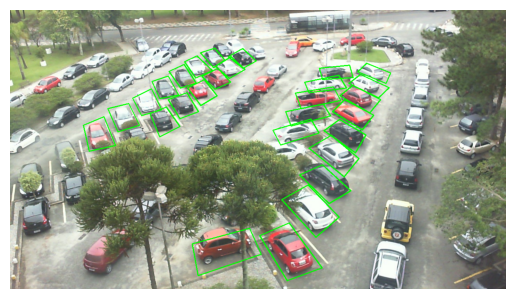

TypeError: Image data of dtype object cannot be converted to float

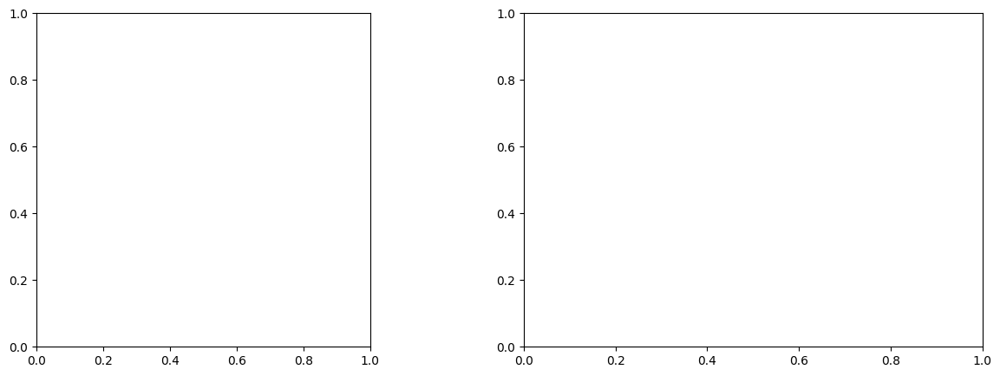

In [211]:
image_path = '../data/PKLot/PKLot/UFPR04/Cloudy/2012-12-12/2012-12-12_10_00_05.jpg'
xml_path = '../data/PKLot/PKLot/UFPR04/Cloudy/2012-12-12/2012-12-12_10_00_05.xml'


to_classify = crop_images(image_path, xml_path)
display_images(to_classify)
classify_parkinglot(to_classify, '../models/resnet18_sunny_datasets.pth')

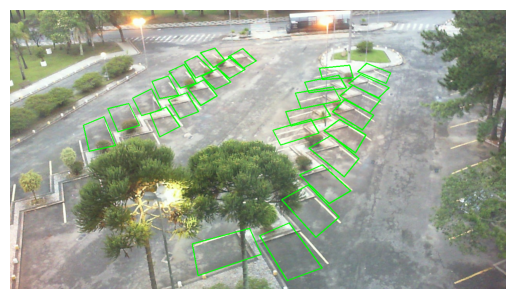

Number of parking spaces: 28
Number of empty spaces: 28
Number of occupied spaces: 0


(28, 28, 0)

In [85]:
image_path = '../data/PKLot/PKLot/UFPR04/Cloudy/2012-12-15/2012-12-15_07_30_02.jpg'
xml_path = '../data/PKLot/PKLot/UFPR04/Cloudy/2012-12-15/2012-12-15_07_30_02.xml'


to_classify = crop_images(image_path, xml_path)
classify_parkinglot(to_classify, '../models/resnet18_sunny_datasets.pth')

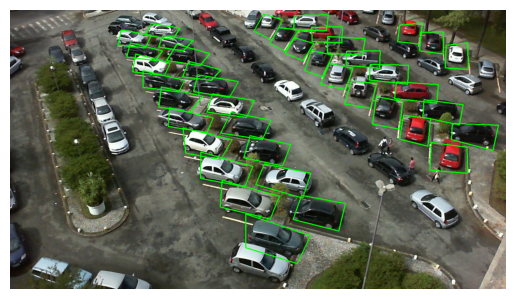

Number of parking spaces: 40
Number of empty spaces: 0
Number of occupied spaces: 40


(40, 0, 40)

In [74]:
image_path = '../data/PKLot/PKLot/UFPR05/Sunny/2013-02-26/2013-02-26_15_09_35.jpg'
xml_path = '../data/PKLot/PKLot/UFPR05/Sunny/2013-02-26/2013-02-26_15_09_35.xml'


to_classify = crop_images(image_path, xml_path)
classify_parkinglot(to_classify, '../models/resnet18_sunny_datasets.pth')

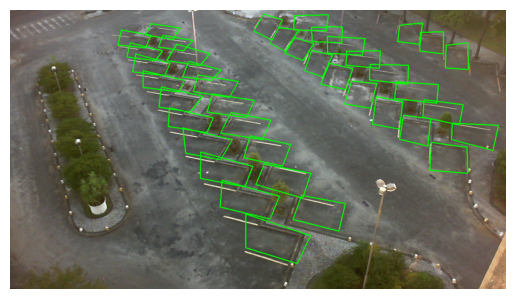

Number of parking spaces: 40
Number of empty spaces: 40
Number of occupied spaces: 0


(40, 40, 0)

In [75]:
image_path = '../data/PKLot/PKLot/UFPR05/Sunny/2013-03-02/2013-03-02_06_45_00.jpg'
xml_path = '../data/PKLot/PKLot/UFPR05/Sunny/2013-03-02/2013-03-02_06_45_00.xml'


to_classify = crop_images(image_path, xml_path)
classify_parkinglot(to_classify, '../models/resnet18_sunny_datasets.pth')

# Possibility to iterate through a complete folder of days

In [ ]:
import os

# Verzeichnispfad zu den Bildern und XML-Dateien
directory_path = '../data/PKLot/PKLot/UFPR05/Cloudy/2013-03-13'

# Iteriere durch alle Dateien im Verzeichnis
for filename in os.listdir(directory_path):
    # Überprüfe, ob es sich um eine Bilddatei handelt
    if filename.endswith(".jpg"):
        # Bildpfad erstellen
        image_path = os.path.join(directory_path, filename)

        # XML-Dateipfad erstellen (angenommen, dass es immer eine entsprechende XML-Datei gibt)
        xml_filename = os.path.splitext(filename)[0] + '.xml'
        xml_path = os.path.join(directory_path, xml_filename)

        # Hier kannst du nun deine Funktionen mit image_path und xml_path aufrufen
        to_classify = crop_images(image_path, xml_path)
        classify_parkinglot(to_classify, '../models/resnet18_sunny_datasets.pth')

In [111]:
def crop_images(image_path, xml_path):
    # Bild laden
    image = cv2.imread(image_path)

    # XML-Datei analysieren
    tree = ET.parse(xml_path)
    root = tree.getroot()

    # Leeres Array für die ausgeschnittenen Boxen
    to_classify = []

    # Kopiere das Originalbild für die Anzeige der Boxen
    image_with_boxes = image.copy()

    # Iteriere durch jede Box im XML
    for space in root.iter('space'):
        space_id = int(space.attrib['id'])
        occupied = int(space.attrib.get('occupied', 0))

        # Extrahiere Koordinaten und Winkel aus XML (Konturkoordinaten)
        contour_points = []
        for point in space.iter('point'):
            x = int(point.attrib['x'])
            y = int(point.attrib['y'])
            contour_points.append((x, y))

        # Konvertiere die Konturpunkte in ein NumPy-Array
        contour_np = np.array(contour_points, dtype=np.int32)
        contour_np = contour_np.reshape((-1, 1, 2))

        # Zeichne ein Rechteck um die Konturpunkte auf dem Bild mit Boxen
        cv2.polylines(image_with_boxes, [contour_np], isClosed=True, color=(0, 255, 0), thickness=2)

        # Extrahiere Winkel aus XML
        angle = float(space.find('./rotatedRect/angle').attrib['d'])

        # Extrahiere Zentrum aus XML
        center_x = float(space.find('./rotatedRect/center').attrib['x'])
        center_y = float(space.find('./rotatedRect/center').attrib['y'])
        center = (center_x, center_y)

        # Berechne die Rotationsmatrix
        rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)

        # Rotiere das Bild
        rotated_image = cv2.warpAffine(image, rotation_matrix, (image.shape[1], image.shape[0]))

        # Schneide die Box aus dem rotierten Bild aus
        rect = cv2.boundingRect(contour_np)
        box_image = rotated_image[rect[1]:rect[1] + rect[3], rect[0]:rect[0] + rect[2]]

        # Füge die ausgeschnittene Box zur Liste hinzu
        to_classify.append((box_image, space_id, occupied))

    # Anzeigen des Bildes mit den eingezeichneten Boxen im Output
    plt.imshow(cv2.cvtColor(image_with_boxes, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    return to_classify


In [97]:
def classify_parkinglot(to_classify, model_path, empty_space_ids, occupied_space_ids):
    num_parking_spaces = len(to_classify)
    loaded_model = models.resnet18()
    loaded_model.fc = nn.Linear(loaded_model.fc.in_features, 2)
    loaded_model.load_state_dict(torch.load(model_path))
    loaded_model.eval()

    data_transform = transforms.Compose([
        transforms.Resize((128, 128), interpolation=Image.BICUBIC),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
    ])

    to_classify_transformed = [data_transform(Image.fromarray(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))) for img in to_classify]
    to_classify_tensor = torch.stack(to_classify_transformed)

    dataset = torch.utils.data.TensorDataset(to_classify_tensor)
    data_loader = DataLoader(dataset, batch_size=32, shuffle=False)

    num_empty_spaces = 0
    num_occupied_spaces = 0

    with torch.no_grad():
        for idx, inputs in enumerate(data_loader):
            outputs = loaded_model(inputs[0])
            _, predictions = torch.max(outputs, 1)

            # Zählen Sie die Anzahl der leeren und besetzten Parkplätze im Batch
            num_empty_spaces += (predictions == 0).sum().item()
            num_occupied_spaces += (predictions == 1).sum().item()

            # Fügen Sie die entsprechenden Indizes den Listen hinzu
            empty_space_ids.extend([idx + i for i, pred in enumerate(predictions) if pred == 0])
            occupied_space_ids.extend([idx + i for i, pred in enumerate(predictions) if pred == 1])

    print(f'Number of parking spaces: {num_parking_spaces}\nNumber of empty spaces: {num_empty_spaces}\nNumber of occupied spaces: {num_occupied_spaces}')
    print(f'Empty space indices: {empty_space_ids}\nOccupied space indices: {occupied_space_ids}')

    return num_parking_spaces, num_empty_spaces, num_occupied_spaces, empty_space_ids, occupied_space_ids

In [104]:
def visualize_results(image_path, xml_path, model_path):
    to_classify, empty_space_ids, occupied_space_ids = crop_images(image_path, xml_path)
    classify_parkinglot(to_classify, model_path)

    # Visualize results with marked IDs
    image = cv2.imread(image_path)
    image_with_boxes = image.copy()

    for space_id in empty_space_ids:
        space = next((space for space in root.iter('space') if int(space.attrib['id']) == space_id), None)
        if space:
            contour_points = [(int(point.attrib['x']), int(point.attrib['y'])) for point in space.iter('point')]
            contour_np = np.array(contour_points, dtype=np.int32)
            contour_np = contour_np.reshape((-1, 1, 2))
            cv2.polylines(image_with_boxes, [contour_np], isClosed=True, color=(0, 255, 0), thickness=2)

    for space_id in occupied_space_ids:
        space = next((space for space in root.iter('space') if int(space.attrib['id']) == space_id), None)
        if space:
            contour_points = [(int(point.attrib['x']), int(point.attrib['y'])) for point in space.iter('point')]
            contour_np = np.array(contour_points, dtype=np.int32)
            contour_np = contour_np.reshape((-1, 1, 2))
            cv2.polylines(image_with_boxes, [contour_np], isClosed=True, color=(255, 0, 0), thickness=2)

    plt.imshow(cv2.cvtColor(image_with_boxes, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()


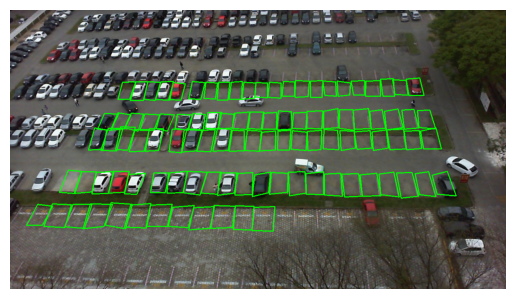

ValueError: too many values to unpack (expected 3)

In [112]:
# Beispielaufruf
image_path = '../data/PKLot/PKLot/PUCPR/Cloudy/2012-09-12/2012-09-12_07_28_48.jpg'
xml_path = '../data/PKLot/PKLot/PUCPR/Cloudy/2012-09-12/2012-09-12_07_28_48.xml'
model_path = '../models/resnet18_sunny_datasets.pth'

to_classify, empty_space_ids, occupied_space_ids = crop_images(image_path, xml_path)
classify_parkinglot(to_classify, model_path, empty_space_ids, occupied_space_ids)

image = cv2.imread(image_path)
image_with_boxes = image.copy()

for idx in empty_space_ids:
    space = next((space for space in root.iter('space') if int(space.attrib['id']) == idx + 1), None)
    if space:
        contour_points = [(int(point.attrib['x']), int(point.attrib['y'])) for point in space.iter('point')]
        contour_np = np.array(contour_points, dtype=np.int32)
        contour_np = contour_np.reshape((-1, 1, 2))
        cv2.polylines(image_with_boxes, [contour_np], isClosed=True, color=(0, 255, 0), thickness=2)

for idx in occupied_space_ids:
    space = next((space for space in root.iter('space') if int(space.attrib['id']) == idx + 1), None)
    if space:
        contour_points = [(int(point.attrib['x']), int(point.attrib['y'])) for point in space.iter('point')]
        contour_np = np.array(contour_points, dtype=np.int32)
        contour_np = contour_np.reshape((-1, 1, 2))
        cv2.polylines(image_with_boxes, [contour_np], isClosed=True, color=(255, 0, 0), thickness=2)

plt.imshow(cv2.cvtColor(image_with_boxes, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [314]:
def crop_images(image_path, xml_path):
    # Bild laden
    image = cv2.imread(image_path)

    # XML-Datei analysieren
    tree = ET.parse(xml_path)
    root = tree.getroot()

    # Leeres Array für die ausgeschnittenen Boxen
    to_classify = []

    # Kopiere das Originalbild für die Anzeige der Boxen
    image_with_boxes = image.copy()

    # Iteriere durch jede Box im XML
    for space in root.iter('space'):
        space_id = int(space.attrib['id'])

        # Extrahiere Koordinaten und Winkel aus XML (Konturkoordinaten)
        contour_points = []
        for point in space.iter('point'):
            x = int(point.attrib['x'])
            y = int(point.attrib['y'])
            contour_points.append((x, y))

        # Konvertiere die Konturpunkte in ein NumPy-Array
        contour_np = np.array(contour_points, dtype=np.int32)
        contour_np = contour_np.reshape((-1, 1, 2))

        # Zeichne ein Rechteck um die Konturpunkte auf dem Bild mit Boxen
        cv2.polylines(image_with_boxes, [contour_np], isClosed=True, color=(0, 255, 0), thickness=2)
        
        # Extrahiere Winkel aus XML
        try:
            angle = float(space.find('./rotatedRect/angle').attrib['d'])
        except (AttributeError, ValueError):
            # Falls angle nicht extrahiert werden kann oder ein ValueError auftritt, setze angle auf 0
            angle = 0.0
        
        # Extrahiere Zentrum aus XML
        center_x = float(space.find('./rotatedRect/center').attrib['x'])
        center_y = float(space.find('./rotatedRect/center').attrib['y'])
        center = (center_x, center_y)

        # Berechne die Rotationsmatrix
        rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)

        # Rotiere das Bild
        rotated_image = cv2.warpAffine(image, rotation_matrix, (image.shape[1], image.shape[0]))

        # Schneide die Box aus dem rotierten Bild aus
        rect = cv2.boundingRect(contour_np)
        box_image = rotated_image[rect[1]:rect[1] + rect[3], rect[0]:rect[0] + rect[2]]

        # Füge die ausgeschnittene Box zur Liste hinzu
        to_classify.append({'image': box_image, 'id': space_id, 'contour': contour_np})

    # Anzeigen des Bildes mit den eingezeichneten Boxen im Output
    plt.imshow(cv2.cvtColor(image_with_boxes, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    return to_classify, image_with_boxes

In [303]:
import torch
import torch.nn as nn
from torchvision import models
from torchvision.models.mobilenetv3 import mobilenet_v3_small

# ...

def load_model(model_path):
    # Extrahiere den Modellnamen aus dem Dateipfad
    model_name = model_path.split('/')[-1].split('_')[0].lower()

    # Dynamisch das entsprechende Modell laden
    if 'squeezenet' in model_name:
        loaded_model = models.squeezenet1_1(pretrained=False)
        loaded_model.classifier[1] = nn.Conv2d(512, 2, kernel_size=(1, 1), stride=(1, 1))
        loaded_model.load_state_dict(torch.load(model_path))
    elif 'resnet' in model_name:
        loaded_model = models.resnet18()
        loaded_model.fc = nn.Linear(loaded_model.fc.in_features, 2)
        loaded_model.load_state_dict(torch.load(model_path))
    elif 'mobile' in model_name:
        loaded_model = models.mobilenet_v3_small()
        loaded_model.classifier[3] = nn.Linear(loaded_model.classifier[3].in_features, 2) 
        loaded_model.load_state_dict(torch.load('../models/mobilenetv3_small_0.5sunny_states.pth'))
        loaded_model.eval()


        
    else:
        raise ValueError(f"Unrecognized model: {model_name}")

    loaded_model.eval()

    return loaded_model

In [287]:
def classify_parkinglot(to_classify, model_path):
    num_parking_spaces = len(to_classify)
    loaded_model = load_model(model_path)

    data_transform = transforms.Compose([
        transforms.Resize((128, 128), interpolation=Image.BICUBIC),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
    ])

    num_empty_spaces = 0
    num_occupied_spaces = 0
    empty_space_ids = []
    occupied_space_ids = []

    with torch.no_grad():
        for box_info in to_classify:
            image = box_info['image']

            # Transformiere das Bild
            image_transformed = data_transform(Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)))
            image_tensor = torch.unsqueeze(image_transformed, 0)

            # Durchlaufe das Modell
            outputs = loaded_model(image_tensor)
            _, prediction = torch.max(outputs, 1)

            # Füge die Klassifizierung zum to_classify-Datensatz hinzu
            box_info['status'] = 'occupied' if prediction.item() == 1 else 'empty'

            # Zählen Sie die Anzahl der leeren und besetzten Parkplätze im Batch
            if prediction.item() == 0:
                num_empty_spaces += 1
                empty_space_ids.append(box_info['id'])
            else:
                num_occupied_spaces += 1
                occupied_space_ids.append(box_info['id'])

    print(f'Number of parking spaces: {num_parking_spaces}\nNumber of empty spaces: {num_empty_spaces}\nNumber of occupied spaces: {num_occupied_spaces}')
    print(f'Empty space IDs: {empty_space_ids}\nOccupied space IDs: {occupied_space_ids}')

    return num_parking_spaces, num_empty_spaces, num_occupied_spaces, empty_space_ids, occupied_space_ids

# Ensemble Methods

In [293]:
import torch
import torch.nn as nn
from torchvision import transforms
from PIL import Image
import cv2
import numpy as np

def ensemble_models(to_classify, model_paths):
    num_parking_spaces = len(to_classify)

    # Laden Sie die drei Modelle
    loaded_models = [load_model(model_path) for model_path in model_paths]

    data_transform = transforms.Compose([
        transforms.Resize((128, 128), interpolation=Image.BICUBIC),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
    ])

    num_empty_spaces = 0
    num_occupied_spaces = 0
    empty_space_ids = []
    occupied_space_ids = []

    with torch.no_grad():
        for box_info in to_classify:
            image = box_info['image']

            # Transformiere das Bild
            image_transformed = data_transform(Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)))
            image_tensor = torch.unsqueeze(image_transformed, 0)

            # Durchlaufe jedes Modell und speichere die Wahrscheinlichkeiten
            probabilities = []
            for loaded_model in loaded_models:
                outputs = loaded_model(image_tensor)
                probabilities.append(outputs.softmax(dim=1).numpy())

            # Berechne den Durchschnitt der Wahrscheinlichkeiten
            average_probabilities = np.mean(probabilities, axis=0)

            # Klassifiziere anhand des Durchschnitts
            prediction = np.argmax(average_probabilities)

            # Füge die Klassifizierung zum to_classify-Datensatz hinzu
            box_info['status'] = 'occupied' if prediction == 1 else 'empty'

            # Zählen Sie die Anzahl der leeren und besetzten Parkplätze im Batch
            if prediction == 0:
                num_empty_spaces += 1
                empty_space_ids.append(box_info['id'])
            else:
                num_occupied_spaces += 1
                occupied_space_ids.append(box_info['id'])

    print(f'Number of parking spaces: {num_parking_spaces}\nNumber of empty spaces: {num_empty_spaces}\nNumber of occupied spaces: {num_occupied_spaces}')
    print(f'Empty space IDs: {empty_space_ids}\nOccupied space IDs: {occupied_space_ids}')

    return num_parking_spaces, num_empty_spaces, num_occupied_spaces, empty_space_ids, occupied_space_ids

# Beispielaufruf mit den Pfaden zu Ihren Modellen
model_paths = ['../models/resnet18_sunny_datasets.pth', '../models/squeezenet1_sunny_datasets.pth']
result = ensemble_models(to_classify, model_paths)

/Users/maximilianveismann/neuefische/pklot/.venv/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/maximilianveismann/neuefische/pklot/.venv/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Number of parking spaces: 40
Number of empty spaces: 11
Number of occupied spaces: 29
Empty space IDs: [19, 23, 24, 25, 26, 29, 32, 33, 35, 38, 40]
Occupied space IDs: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 27, 28, 30, 31, 34, 36, 37, 39]


Space ID: 1, Status: occupied
Space ID: 2, Status: occupied
Space ID: 3, Status: occupied
Space ID: 4, Status: occupied
Space ID: 5, Status: occupied
Space ID: 6, Status: occupied
Space ID: 7, Status: occupied
Space ID: 8, Status: occupied
Space ID: 9, Status: occupied
Space ID: 10, Status: occupied
Space ID: 11, Status: occupied
Space ID: 12, Status: occupied
Space ID: 13, Status: occupied
Space ID: 14, Status: occupied
Space ID: 15, Status: occupied
Space ID: 16, Status: occupied
Space ID: 17, Status: occupied
Space ID: 18, Status: occupied
Space ID: 19, Status: empty
Space ID: 20, Status: occupied
Space ID: 21, Status: occupied
Space ID: 22, Status: occupied
Space ID: 23, Status: empty
Space ID: 24, Status: empty
Space ID: 25, Status: empty
Space ID: 26, Status: empty
Space ID: 27, Status: occupied
Space ID: 28, Status: occupied
Space ID: 29, Status: empty
Space ID: 30, Status: occupied
Space ID: 31, Status: occupied
Space ID: 32, Status: empty
Space ID: 33, Status: empty
Space ID: 

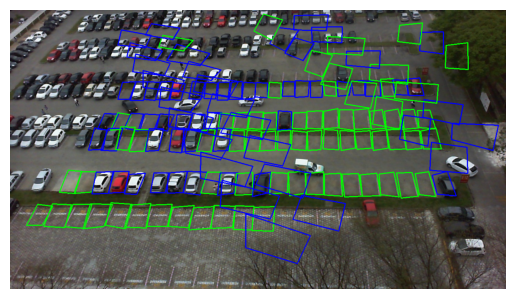

In [185]:
for box_info in to_classify:
    space_id = box_info['id']
    status = box_info.get('status')
    print(f'Space ID: {space_id}, Status: {status}')

    contour_np = box_info['contour']

    if space_id in occupied_space_ids:
        cv2.polylines(image, [contour_np], isClosed=True, color=(255, 0, 0), thickness=2)
    elif space_id in empty_space_ids:
        cv2.polylines(image, [contour_np], isClosed=True, color=(0, 255, 0), thickness=2)

plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [183]:
def visualize_results(image_path, xml_path, model_path):
    
    # Visualize results with marked IDs
    image = image_with_boxes.copy()

    for box_info in to_classify:
        space_id = box_info['id']
        contour_np = box_info['contour']

        if space_id in occupied_space_ids:
            cv2.polylines(image, [contour_np], isClosed=True, color=(0, 0, 255), thickness=2)
        elif space_id in empty_space_ids:
            cv2.polylines(image, [contour_np], isClosed=True, color=(0, 255, 0), thickness=2)

    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

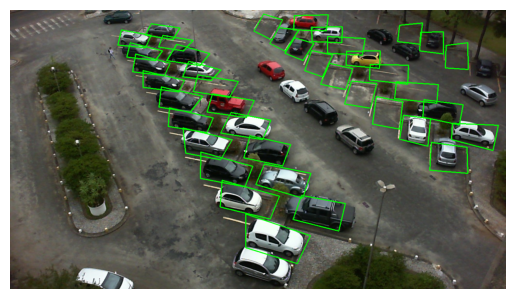

/Users/maximilianveismann/neuefische/pklot/.venv/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/maximilianveismann/neuefische/pklot/.venv/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Number of parking spaces: 40
Number of empty spaces: 11
Number of occupied spaces: 29
Empty space IDs: [19, 23, 24, 25, 26, 29, 32, 33, 35, 38, 40]
Occupied space IDs: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 27, 28, 30, 31, 34, 36, 37, 39]


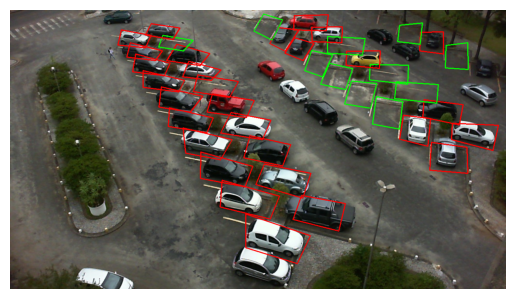

In [294]:
# Beispielaufruf
image_path = '../data/PKLot/PKLot/UFPR05/Cloudy/2013-02-22/2013-02-22_17_10_11.jpg'
xml_path = '../data/PKLot/PKLot/UFPR05/Cloudy/2013-02-22/2013-02-22_17_10_11.xml'
model_path = '../models/squeezenet1_sunny_datasets.pth'

to_classify, image_with_boxes = crop_images(image_path, xml_path)
_, _, _, empty_space_ids, occupied_space_ids = ensemble_models(to_classify, model_paths)
visualize_results(image_path, xml_path, model_path)

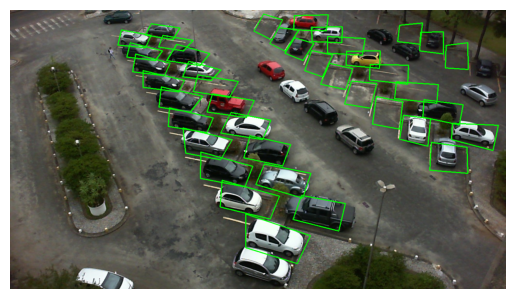

Number of parking spaces: 40
Number of empty spaces: 11
Number of occupied spaces: 29
Empty space IDs: [19, 23, 24, 25, 26, 29, 32, 33, 35, 38, 40]
Occupied space IDs: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 27, 28, 30, 31, 34, 36, 37, 39]


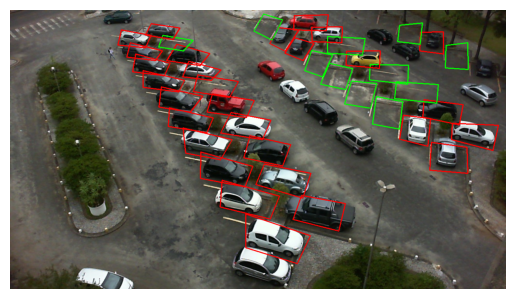

In [292]:
# Beispielaufruf
image_path = '../data/PKLot/PKLot/UFPR05/Cloudy/2013-02-22/2013-02-22_17_10_11.jpg'
xml_path = '../data/PKLot/PKLot/UFPR05/Cloudy/2013-02-22/2013-02-22_17_10_11.xml'
model_path = '../models/resnet18_sunny_datasets.pth'

to_classify, image_with_boxes = crop_images(image_path, xml_path)
_, _, _, empty_space_ids, occupied_space_ids = classify_parkinglot(to_classify, model_path)
visualize_results(image_path, xml_path, model_path)

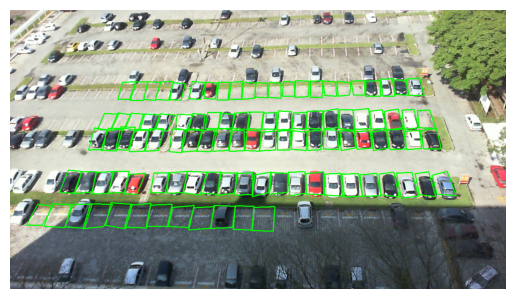

Number of parking spaces: 100
Number of empty spaces: 32
Number of occupied spaces: 68
Empty space IDs: [1, 2, 3, 4, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 23, 24, 25, 30, 33, 44, 79, 89, 90, 92, 93, 94, 95, 96, 97, 99, 100]
Occupied space IDs: [5, 6, 7, 19, 20, 21, 22, 26, 27, 28, 29, 31, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 80, 81, 82, 83, 84, 85, 86, 87, 88, 91, 98]


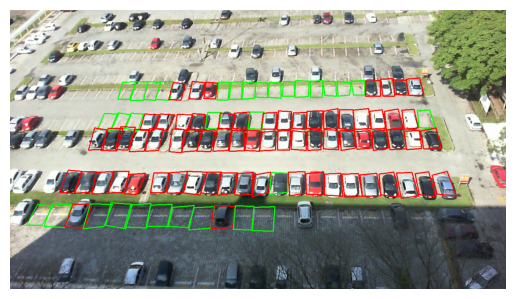

In [295]:
# Beispielaufruf
image_path = '../data/PKLot/PKLot/PUCPR/Sunny/2012-09-21/2012-09-21_14_50_32.jpg'
xml_path = '../data/PKLot/PKLot/PUCPR/Sunny/2012-09-21/2012-09-21_14_50_32.xml'
model_path = '../models/resnet18_sunny_datasets.pth'

to_classify, image_with_boxes = crop_images(image_path, xml_path)
_, _, _, empty_space_ids, occupied_space_ids = classify_parkinglot(to_classify, model_path)
visualize_results(image_path, xml_path, model_path)

In [252]:
model_path = '../models/mobile_net_v3_small.pth'
state_dict = torch.load(model_path)

# Drucke die Schlüssel des state_dict
print(state_dict.keys())

# Prüfe, ob 'model' als Schlüssel vorhanden ist
if 'model' in state_dict:
    print("The model was saved as a whole.")
else:
    print("The model was saved as state_dict only.")

AttributeError: 'MobileNetV3' object has no attribute 'keys'

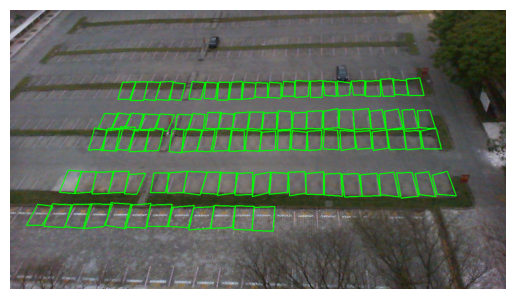

Number of parking spaces: 100
Number of empty spaces: 100
Number of occupied spaces: 0
Empty space IDs: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
Occupied space IDs: []


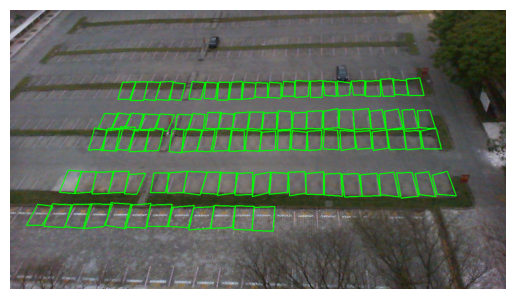

In [317]:
# Beispielaufruf
image_path = '../data/PKLot/PKLot/PUCPR/Cloudy/2012-09-12/2012-09-12_06_05_16.jpg'
xml_path = '../data/PKLot/PKLot/PUCPR/Cloudy/2012-09-12/2012-09-12_06_05_16.xml'
model_paths = ['../models/resnet18_sunny_datasets.pth', '..//models/squeezenet1_sunny_datasets.pth']

to_classify, image_with_boxes = crop_images(image_path, xml_path)
_, _, _, empty_space_ids, occupied_space_ids = ensemble_models(to_classify, model_paths)
visualize_results(image_path, xml_path, model_path)

In [ ]:
torch.load('../models/mobile_net_v3_small.pth', map_location='cpu')

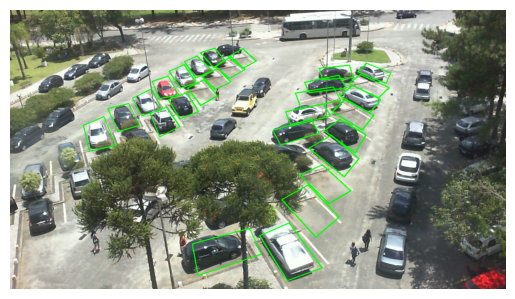

Number of parking spaces: 28
Number of empty spaces: 8
Number of occupied spaces: 20
Empty space IDs: [2, 3, 6, 13, 18, 19, 20, 21]
Occupied space IDs: [1, 4, 5, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 22, 23, 24, 25, 26, 27, 28]


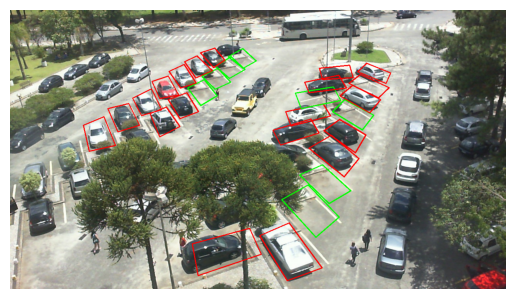

In [176]:
# Beispielaufruf
image_path = '../data/PKLot/PKLot/UFPR04/Sunny/2012-12-19/2012-12-19_13_25_08.jpg'
xml_path = '../data/PKLot/PKLot/UFPR04/Sunny/2012-12-19/2012-12-19_13_25_08.xml'
model_path = '../models/resnet18_sunny_datasets.pth'

visualize_results(image_path, xml_path, model_path)

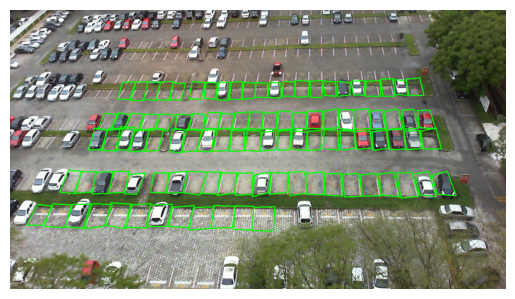

Number of parking spaces: 100
Number of empty spaces: 69
Number of occupied spaces: 31
Empty space IDs: [1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 13, 14, 15, 16, 19, 20, 22, 23, 25, 26, 27, 29, 30, 31, 32, 33, 34, 35, 36, 38, 40, 42, 46, 49, 51, 53, 54, 55, 57, 59, 60, 61, 66, 67, 68, 70, 72, 74, 75, 76, 77, 79, 80, 81, 82, 83, 84, 85, 86, 89, 90, 92, 93, 94, 96, 97, 98, 99, 100]
Occupied space IDs: [8, 12, 17, 18, 21, 24, 28, 37, 39, 41, 43, 44, 45, 47, 48, 50, 52, 56, 58, 62, 63, 64, 65, 69, 71, 73, 78, 87, 88, 91, 95]


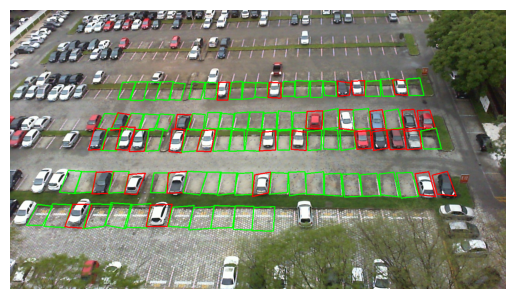

In [306]:
# Beispielaufruf
image_path = '../data/PKLot/PKLot/PUCPR/Rainy/2012-10-11/2012-10-11_18_21_58.jpg'
xml_path = '../data/PKLot/PKLot/PUCPR/Rainy/2012-10-11/2012-10-11_18_21_58.xml'
model_paths = ['../models/resnet18_sunny_datasets.pth', '../models/squeezenet1_sunny_datasets.pth']

to_classify, image_with_boxes = crop_images(image_path, xml_path)
_, _, _, empty_space_ids, occupied_space_ids = ensemble_models(to_classify, model_paths)
visualize_results(image_path, xml_path, model_path)

In [ ]:
loaded_model = models.mobilenet_v3_small()
loaded_model.classifier[3] = nn.Linear(loaded_model.classifier[3].in_features, 2) 
loaded_model.load_state_dict(torch.load('../models/mobilenetv3_small_0.5sunny_states.pth'))
loaded_model.eval()



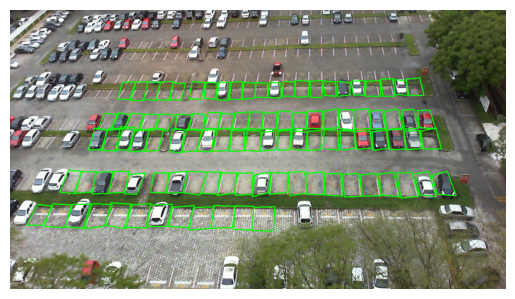

Number of parking spaces: 100
Number of empty spaces: 69
Number of occupied spaces: 31
Empty space IDs: [1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 13, 14, 15, 16, 19, 20, 22, 23, 25, 26, 27, 29, 30, 31, 32, 33, 34, 35, 36, 38, 40, 42, 46, 49, 51, 53, 54, 55, 57, 59, 60, 61, 66, 67, 68, 70, 72, 74, 75, 76, 77, 79, 80, 81, 82, 83, 84, 85, 86, 89, 90, 92, 93, 94, 96, 97, 98, 99, 100]
Occupied space IDs: [8, 12, 17, 18, 21, 24, 28, 37, 39, 41, 43, 44, 45, 47, 48, 50, 52, 56, 58, 62, 63, 64, 65, 69, 71, 73, 78, 87, 88, 91, 95]


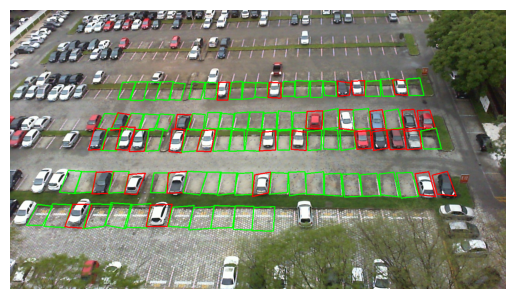

In [305]:
# Beispielaufruf
image_path = '../data/PKLot/PKLot/PUCPR/Rainy/2012-10-11/2012-10-11_18_21_58.jpg'
xml_path = '../data/PKLot/PKLot/PUCPR/Rainy/2012-10-11/2012-10-11_18_21_58.xml'
model_paths = ['../models/resnet18_sunny_datasets.pth', '../models/squeezenet1_sunny_datasets.pth','../models/mobilenetv3_small_0.5sunny_states.pth']

to_classify, image_with_boxes = crop_images(image_path, xml_path)
_, _, _, empty_space_ids, occupied_space_ids = ensemble_models(to_classify, model_paths)
visualize_results(image_path, xml_path, model_path)

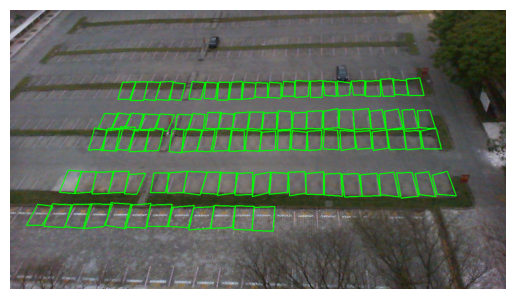

/Users/maximilianveismann/neuefische/pklot/.venv/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/maximilianveismann/neuefische/pklot/.venv/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Number of parking spaces: 100
Number of empty spaces: 100
Number of occupied spaces: 0
Empty space IDs: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]
Occupied space IDs: []


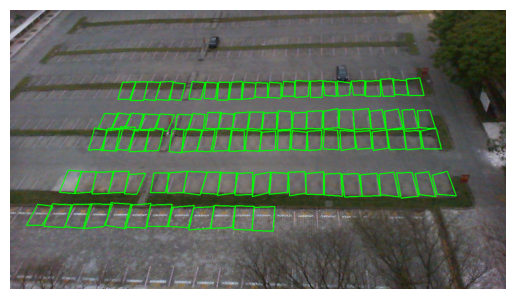

In [312]:
# Beispielaufruf
image_path = '../data/PKLot/PKLot/PUCPR/Cloudy/2012-09-12/2012-09-12_06_05_16.jpg'
xml_path = '../data/PKLot/PKLot/PUCPR/Cloudy/2012-09-12/2012-09-12_06_05_16.xml'
model_paths = ['../models/squeezenet1_sunny_datasets.pth', '../models/resnet18_sunny_datasets.pth']

to_classify, image_with_boxes = crop_images(image_path, xml_path)
_, _, _, empty_space_ids, occupied_space_ids = ensemble_models(to_classify, model_paths)
visualize_results(image_path, xml_path, model_path)

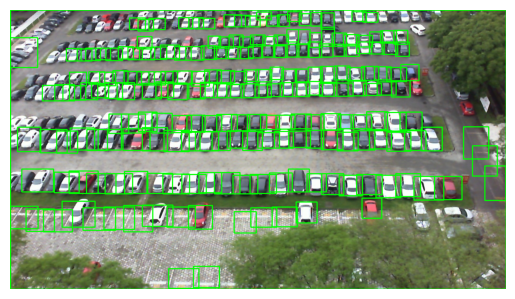

/Users/maximilianveismann/neuefische/pklot/.venv/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/maximilianveismann/neuefische/pklot/.venv/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Number of parking spaces: 207
Number of empty spaces: 16
Number of occupied spaces: 191
Empty space IDs: [54, 63, 64, 77, 84, 113, 116, 136, 163, 168, 176, 178, 188, 199, 201, 206]
Occupied space IDs: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 62, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 114, 115, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 164, 165, 166, 167, 169, 170, 171, 172, 173, 174, 175, 177, 179, 180, 181, 182, 183, 184, 185, 186, 187, 189, 190, 191, 192, 193, 1

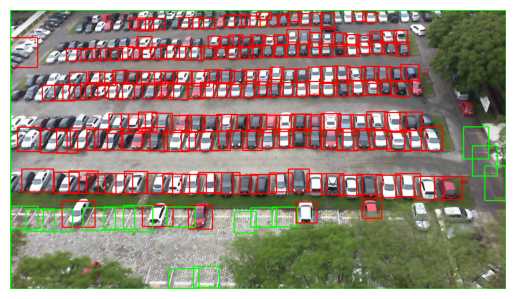

In [315]:
# Beispielaufruf
image_path = '../data/final/first_try/2012-10-23_08_15_50.jpg'
xml_path = '../data/final/first_try/2012-10-23_08_15_50.xml'
model_paths = ['../models/squeezenet1_sunny_datasets.pth', '../models/resnet18_sunny_datasets.pth']

to_classify, image_with_boxes = crop_images(image_path, xml_path)
_, _, _, empty_space_ids, occupied_space_ids = ensemble_models(to_classify, model_paths)
visualize_results(image_path, xml_path, model_path)

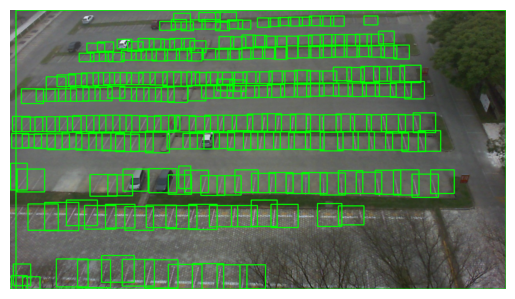

Number of parking spaces: 244
Number of empty spaces: 240
Number of occupied spaces: 4
Empty space IDs: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 20

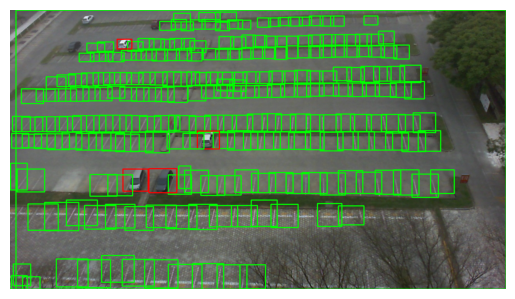

In [338]:
# Beispielaufruf
image_path = '../data/final/first_try/2012-09-16_07_32_58.jpg'
xml_path = '../data/final/first_try/2012-09-16_07_32_58.xml'
model_paths = ['../models/squeezenet1_sunny_datasets.pth', '../models/resnet18_sunny_datasets.pth']

to_classify, image_with_boxes = crop_images(image_path, xml_path)
_, _, _, empty_space_ids, occupied_space_ids = ensemble_models(to_classify, model_paths)
visualize_results(image_path, xml_path, model_path)

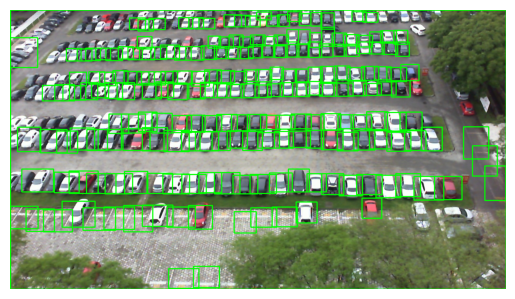

Number of parking spaces: 207
Number of empty spaces: 16
Number of occupied spaces: 191
Empty space IDs: [54, 63, 64, 77, 84, 113, 116, 136, 163, 168, 176, 178, 188, 199, 201, 206]
Occupied space IDs: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 62, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 114, 115, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 164, 165, 166, 167, 169, 170, 171, 172, 173, 174, 175, 177, 179, 180, 181, 182, 183, 184, 185, 186, 187, 189, 190, 191, 192, 193, 1

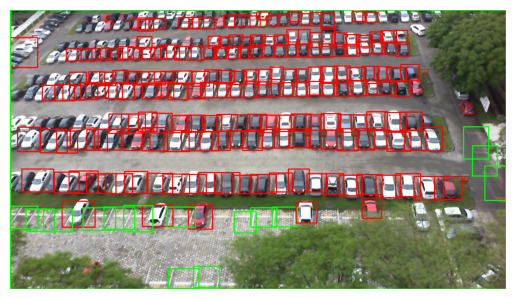

In [339]:
# Beispielaufruf
image_path = '../data/final/first_try/2012-10-23_08_15_50.jpg'
xml_path = '../data/final/first_try/2012-10-23_08_15_50.xml'
model_paths = ['../models/squeezenet1_sunny_datasets.pth', '../models/resnet18_sunny_datasets.pth']

to_classify, image_with_boxes = crop_images(image_path, xml_path)
_, _, _, empty_space_ids, occupied_space_ids = ensemble_models(to_classify, model_paths)
visualize_results(image_path, xml_path, model_path)

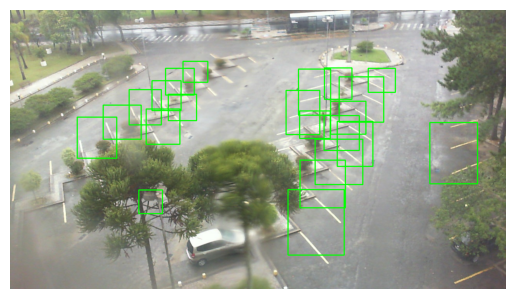

/Users/maximilianveismann/neuefische/pklot/.venv/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/maximilianveismann/neuefische/pklot/.venv/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Number of parking spaces: 22
Number of empty spaces: 22
Number of occupied spaces: 0
Empty space IDs: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
Occupied space IDs: []


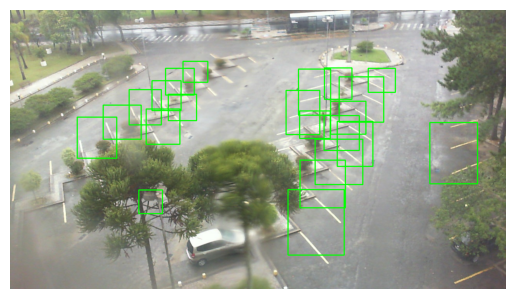

In [320]:
# Beispielaufruf
image_path = '../data/final/first_try/2012-12-15_16_30_13.jpg'
xml_path = '../data/final/first_try/2012-12-15_16_30_13.xml'
model_paths = ['../models/squeezenet1_sunny_datasets.pth', '../models/resnet18_sunny_datasets.pth']

to_classify, image_with_boxes = crop_images(image_path, xml_path)
_, _, _, empty_space_ids, occupied_space_ids = ensemble_models(to_classify, model_paths)
visualize_results(image_path, xml_path, model_path)

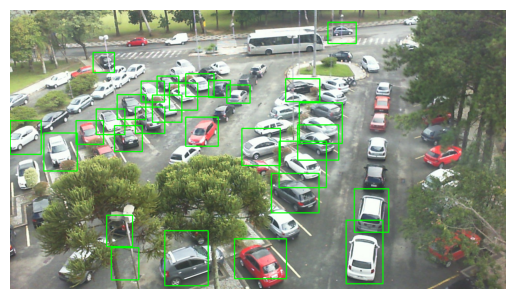

/Users/maximilianveismann/neuefische/pklot/.venv/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/maximilianveismann/neuefische/pklot/.venv/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Number of parking spaces: 29
Number of empty spaces: 1
Number of occupied spaces: 28
Empty space IDs: [9]
Occupied space IDs: [1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]


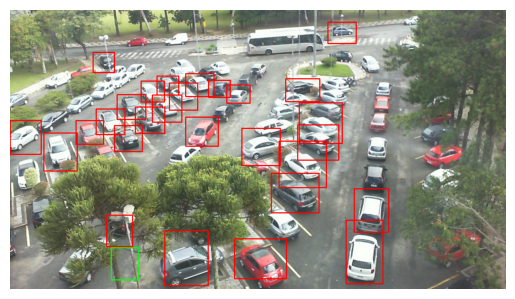

In [321]:
# Beispielaufruf
image_path = '../data/final/first_try/2013-01-21_10_25_05.jpg'
xml_path = '../data/final/first_try/2013-01-21_10_25_05.xml'
model_paths = ['../models/squeezenet1_sunny_datasets.pth', '../models/resnet18_sunny_datasets.pth']

to_classify, image_with_boxes = crop_images(image_path, xml_path)
_, _, _, empty_space_ids, occupied_space_ids = ensemble_models(to_classify, model_paths)
visualize_results(image_path, xml_path, model_path)

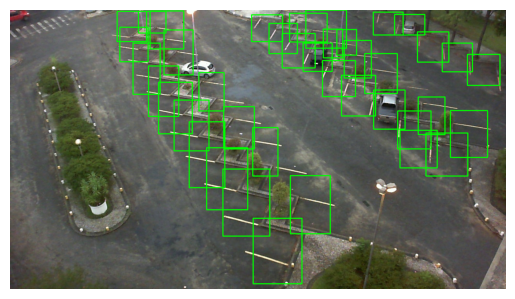

Number of parking spaces: 40
Number of empty spaces: 37
Number of occupied spaces: 3
Empty space IDs: [1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 36, 37, 38, 39, 40]
Occupied space IDs: [9, 17, 32]


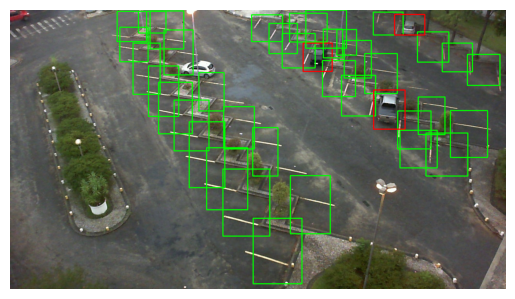

In [329]:
# Beispielaufruf
image_path = '../data/final/first_try/2013-03-16_16_40_12.jpg'
xml_path = '../data/final/first_try/2013-03-16_16_40_12.xml'
model_paths = ['../models/squeezenet1_sunny_datasets.pth', '../models/resnet18_sunny_datasets.pth']

to_classify, image_with_boxes = crop_images(image_path, xml_path)
_, _, _, empty_space_ids, occupied_space_ids = ensemble_models(to_classify, model_paths)
visualize_results(image_path, xml_path, model_path)

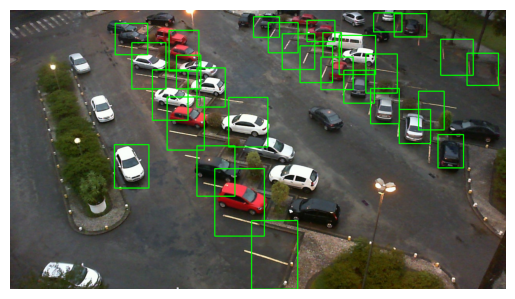

Number of parking spaces: 30
Number of empty spaces: 5
Number of occupied spaces: 25
Empty space IDs: [1, 2, 4, 11, 18]
Occupied space IDs: [3, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]


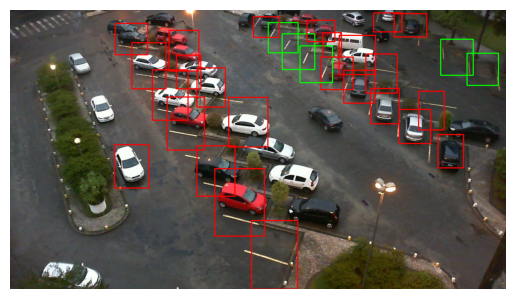

In [337]:
# Beispielaufruf
image_path = '../data/final/first_try/2013-03-20_18_10_14.jpg'
xml_path = '../data/final/first_try/2013-03-20_18_10_14.xml'
model_paths = ['../models/squeezenet1_sunny_datasets.pth', '../models/resnet18_sunny_datasets.pth']

to_classify, image_with_boxes = crop_images(image_path, xml_path)
_, _, _, empty_space_ids, occupied_space_ids = ensemble_models(to_classify, model_paths)
visualize_results(image_path, xml_path, model_path)

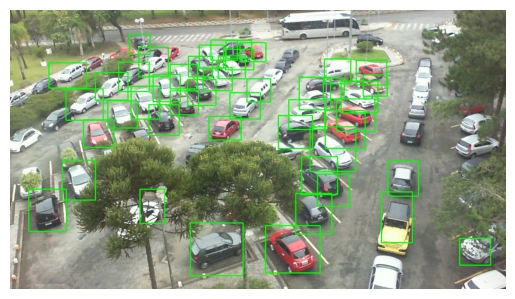

Number of parking spaces: 47
Number of empty spaces: 0
Number of occupied spaces: 47
Empty space IDs: []
Occupied space IDs: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 40, 41, 42, 44, 45, 46, 47, 48, 49]


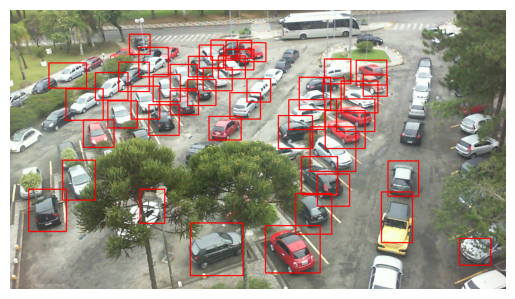

In [333]:
# Beispielaufruf
image_path = '../data/final/model_try/2012-12-17_10_50_06.jpg'
xml_path = '../data/final/model_try/2012-12-17_10_50_06.xml'
model_paths = ['../models/squeezenet1_sunny_datasets.pth', '../models/resnet18_sunny_datasets.pth']

to_classify, image_with_boxes = crop_images(image_path, xml_path)
_, _, _, empty_space_ids, occupied_space_ids = ensemble_models(to_classify, model_paths)
visualize_results(image_path, xml_path, model_path)

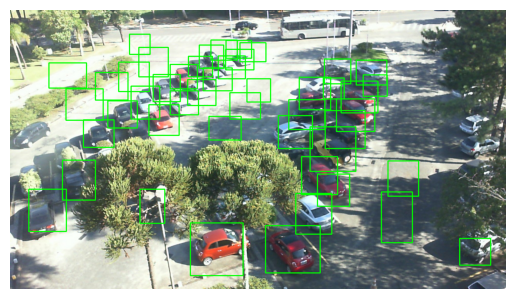

/Users/maximilianveismann/neuefische/pklot/.venv/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/maximilianveismann/neuefische/pklot/.venv/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Number of parking spaces: 47
Number of empty spaces: 14
Number of occupied spaces: 33
Empty space IDs: [17, 20, 26, 31, 33, 35, 37, 40, 41, 42, 44, 45, 46, 48]
Occupied space IDs: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 27, 28, 29, 30, 32, 34, 36, 38, 47, 49]


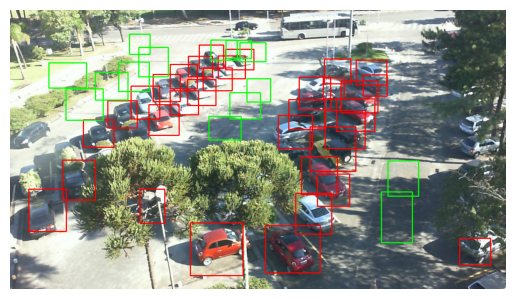

In [334]:
# Beispielaufruf
image_path = '../data/PKLot/PKLot/UFPR04/Sunny/2012-12-21/2012-12-21_09_40_04.jpg'
xml_path = '../data/final/model_try/2012-12-17_10_50_06.xml'
model_paths = ['../models/squeezenet1_sunny_datasets.pth', '../models/resnet18_sunny_datasets.pth']

to_classify, image_with_boxes = crop_images(image_path, xml_path)
_, _, _, empty_space_ids, occupied_space_ids = ensemble_models(to_classify, model_paths)
visualize_results(image_path, xml_path, model_path)

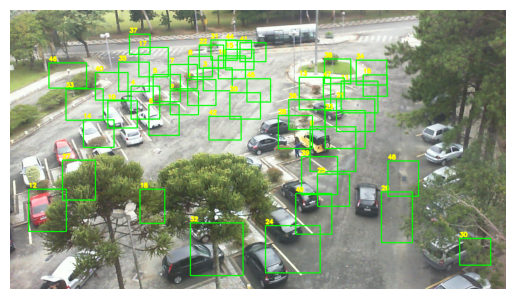

Number of parking spaces: 47
Number of empty spaces: 37
Number of occupied spaces: 10
Empty space IDs: [1, 2, 3, 5, 7, 8, 11, 13, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 27, 28, 29, 30, 33, 34, 35, 36, 37, 38, 40, 41, 42, 44, 45, 46, 47, 48]
Occupied space IDs: [4, 6, 9, 10, 12, 14, 24, 31, 32, 49]


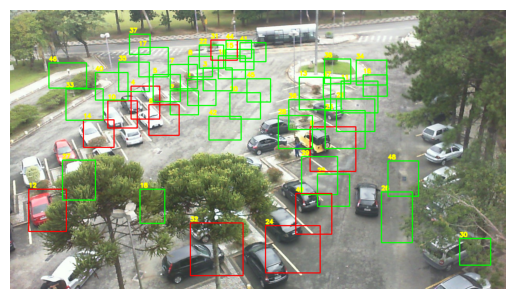

In [346]:
# Beispielaufruf
image_path = '../data/PKLot/PKLot/UFPR04/Sunny/2013-01-17/2013-01-17_11_05_07.jpg'
xml_path = '../data/final/model_try/2012-12-17_10_50_06.xml'
model_paths = ['../models/squeezenet1_sunny_datasets.pth', '../models/resnet18_sunny_datasets.pth']

to_classify, image_with_boxes = crop_images1(image_path, xml_path)
_, _, _, empty_space_ids, occupied_space_ids = ensemble_models(to_classify, model_paths)
visualize_results(image_path, xml_path, model_path)

In [345]:
def crop_images1(image_path, xml_path):
    # Bild laden
    image = cv2.imread(image_path)

    # XML-Datei analysieren
    tree = ET.parse(xml_path)
    root = tree.getroot()

    # Leeres Array für die ausgeschnittenen Boxen
    to_classify = []

    # Kopiere das Originalbild für die Anzeige der Boxen
    image_with_boxes = image.copy()

    # Iteriere durch jede Box im XML
    for space in root.iter('space'):
        space_id = int(space.attrib['id'])

        # Extrahiere Koordinaten und Winkel aus XML (Konturkoordinaten)
        contour_points = []
        for point in space.iter('point'):
            x = int(point.attrib['x'])
            y = int(point.attrib['y'])
            contour_points.append((x, y))

        # Konvertiere die Konturpunkte in ein NumPy-Array
        contour_np = np.array(contour_points, dtype=np.int32)
        contour_np = contour_np.reshape((-1, 1, 2))

        # Zeichne ein Rechteck um die Konturpunkte auf dem Bild mit Boxen
        cv2.polylines(image_with_boxes, [contour_np], isClosed=True, color=(0, 255, 0), thickness=2)
        
        # Extrahiere Winkel aus XML
        try:
            angle = float(space.find('./rotatedRect/angle').attrib['d'])
        except (AttributeError, ValueError):
            # Falls angle nicht extrahiert werden kann oder ein ValueError auftritt, setze angle auf 0
            angle = 0.0
        
        # Extrahiere Zentrum aus XML
        center_x = float(space.find('./rotatedRect/center').attrib['x'])
        center_y = float(space.find('./rotatedRect/center').attrib['y'])
        center = (center_x, center_y)

        # Berechne die Rotationsmatrix
        rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)

        # Rotiere das Bild
        rotated_image = cv2.warpAffine(image, rotation_matrix, (image.shape[1], image.shape[0]))

        # Schneide die Box aus dem rotierten Bild aus
        rect = cv2.boundingRect(contour_np)
        box_image = rotated_image[rect[1]:rect[1] + rect[3], rect[0]:rect[0] + rect[2]]

        # Füge die ausgeschnittene Box zur Liste hinzu
        to_classify.append({'image': box_image, 'id': space_id, 'contour': contour_np})
        
        # Beschrifte das Bild mit der Box-ID
        cv2.putText(image_with_boxes, str(space_id), (rect[0], rect[1] - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 2, cv2.LINE_AA)

    # Anzeigen des Bildes mit den eingezeichneten Boxen im Output
    plt.imshow(cv2.cvtColor(image_with_boxes, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    return to_classify, image_with_boxes

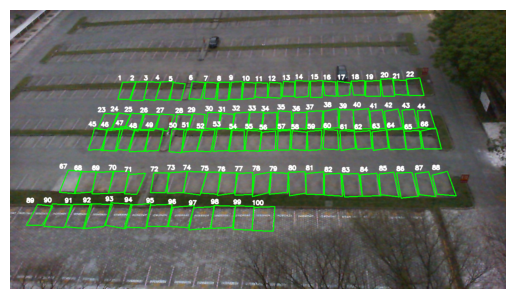

([{'image': array([[[114, 112, 111],
           [116, 111, 112],
           [115, 109, 110],
           ...,
           [111, 112, 123],
           [115, 111, 122],
           [116, 109, 121]],
   
          [[112, 110, 109],
           [114, 110, 111],
           [114, 109, 110],
           ...,
           [110, 112, 123],
           [114, 111, 122],
           [116, 110, 120]],
   
          [[111, 109, 108],
           [112, 109, 108],
           [113, 108, 109],
           ...,
           [107, 113, 122],
           [110, 112, 120],
           [113, 111, 119]],
   
          ...,
   
          [[107, 105, 105],
           [106, 104, 105],
           [106, 102, 104],
           ...,
           [ 50,  71,  69],
           [ 49,  68,  69],
           [ 50,  69,  73]],
   
          [[106, 107, 105],
           [105, 106, 106],
           [104, 104, 106],
           ...,
           [ 50,  71,  70],
           [ 47,  68,  70],
           [ 47,  68,  73]],
   
          [[105, 108, 107],

In [342]:
image_path = '../data/PKLot/PKLot/PUCPR/Cloudy/2012-09-12/2012-09-12_06_05_16.jpg'
xml_path = '../data/PKLot/PKLot/PUCPR/Cloudy/2012-09-12/2012-09-12_06_05_16.xml'
crop_images1(image_path, xml_path)

In [357]:
def show_images_with_boxes(image_path, xml_path):
    # Bild laden
    image = cv2.imread(image_path)

    # XML-Datei analysieren
    tree = ET.parse(xml_path)
    root = tree.getroot()

    # Kopiere das Originalbild für die Anzeige der Boxen
    image_with_boxes = image.copy()

    # Iteriere durch jede Box im XML
    for space in root.iter('space'):
        space_id = int(space.attrib['id'])

        # Extrahiere Koordinaten und Winkel aus XML (Konturkoordinaten)
        contour_points = []
        for point in space.iter('point'):
            x = int(point.attrib['x'])
            y = int(point.attrib['y'])
            contour_points.append((x, y))

        # Konvertiere die Konturpunkte in ein NumPy-Array
        contour_np = np.array(contour_points, dtype=np.int32)
        contour_np = contour_np.reshape((-1, 1, 2))

        # Zeichne ein Rechteck um die Konturpunkte auf dem Bild mit Boxen
        cv2.polylines(image_with_boxes, [contour_np], isClosed=True, color=(0, 255, 0), thickness=2)

        # Extrahiere Winkel aus XML
        try:
            angle = float(space.find('./rotatedRect/angle').attrib['d'])
        except (AttributeError, ValueError):
            # Falls angle nicht extrahiert werden kann oder ein ValueError auftritt, setze angle auf 0
            angle = 0.0

        # Extrahiere Zentrum aus XML
        center_x = float(space.find('./rotatedRect/center').attrib['x'])
        center_y = float(space.find('./rotatedRect/center').attrib['y'])
        center = (center_x, center_y)

        # Beschrifte das Bild mit der Box-ID
        cv2.putText(image_with_boxes, str(space_id), (int(center_x), int(center_y) - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 2, cv2.LINE_AA)

    # Anzeigen des Bildes mit den eingezeichneten Boxen im Output
    plt.imshow(cv2.cvtColor(image_with_boxes, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

In [351]:
def remove_spaces_by_ids(xml_file_path, ids_to_remove):
    # XML-Datei analysieren
    tree = ET.parse(xml_file_path)
    root = tree.getroot()

    # Iteriere über alle "space"-Elemente und entferne diejenigen mit den angegebenen IDs
    for space_id in ids_to_remove:
        space_to_remove = root.find(f'.//space[@id="{space_id}"]')
        if space_to_remove is not None:
            root.remove(space_to_remove)

    # Speichere die Änderungen zurück in die XML-Datei
    tree.write(xml_file_path)

    # Lese den aktualisierten Inhalt der Datei
    with open(xml_file_path, 'r') as file:
        updated_xml = file.read()

    return updated_xml

In [352]:
def crop_images1(image_path, updated_xml_string):
    # Bild laden
    image = cv2.imread(image_path)

    # XML-String analysieren
    root = ET.fromstring(updated_xml_string)

    # Leeres Array für die ausgeschnittenen Boxen
    to_classify = []

    # Kopiere das Originalbild für die Anzeige der Boxen
    image_with_boxes = image.copy()

    # Iteriere durch jede Box im XML
    for space in root.iter('space'):
        space_id = int(space.attrib['id'])

        # Extrahiere Koordinaten und Winkel aus XML (Konturkoordinaten)
        contour_points = []
        for point in space.iter('point'):
            x = int(point.attrib['x'])
            y = int(point.attrib['y'])
            contour_points.append((x, y))

        # Konvertiere die Konturpunkte in ein NumPy-Array
        contour_np = np.array(contour_points, dtype=np.int32)
        contour_np = contour_np.reshape((-1, 1, 2))

        # Zeichne ein Rechteck um die Konturpunkte auf dem Bild mit Boxen
        cv2.polylines(image_with_boxes, [contour_np], isClosed=True, color=(0, 255, 0), thickness=2)
        
        # Extrahiere Winkel aus XML
        try:
            angle = float(space.find('./rotatedRect/angle').attrib['d'])
        except (AttributeError, ValueError):
            # Falls angle nicht extrahiert werden kann oder ein ValueError auftritt, setze angle auf 0
            angle = 0.0
        
        # Extrahiere Zentrum aus XML
        center_x = float(space.find('./rotatedRect/center').attrib['x'])
        center_y = float(space.find('./rotatedRect/center').attrib['y'])
        center = (center_x, center_y)

        # Berechne die Rotationsmatrix
        rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)

        # Rotiere das Bild
        rotated_image = cv2.warpAffine(image, rotation_matrix, (image.shape[1], image.shape[0]))

        # Schneide die Box aus dem rotierten Bild aus
        rect = cv2.boundingRect(contour_np)
        box_image = rotated_image[rect[1]:rect[1] + rect[3], rect[0]:rect[0] + rect[2]]

        # Füge die ausgeschnittene Box zur Liste hinzu
        to_classify.append({'image': box_image, 'id': space_id, 'contour': contour_np})
        
        # Beschrifte das Bild mit der Box-ID
        cv2.putText(image_with_boxes, str(space_id), (rect[0], rect[1] - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 2, cv2.LINE_AA)

    # Anzeigen des Bildes mit den eingezeichneten Boxen im Output
    plt.imshow(cv2.cvtColor(image_with_boxes, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    return to_classify, image_with_boxes

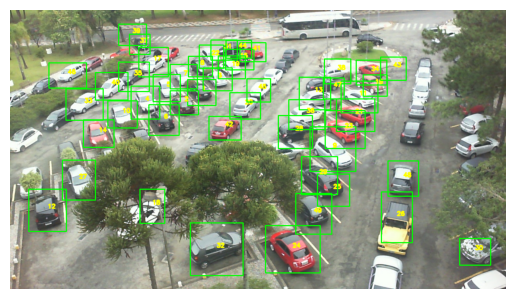

In [380]:
image_path = '../data/final/model_try/2012-12-17_10_50_06.jpg'
xml_path = '../data/final/model_try/2012-12-17_10_50_06 copy.xml'

show_images_with_boxes(image_path, xml_path)

In [372]:
ids_to_remove = [46, 37, 30, 26, 42, 20, 45, 33, 40, 35]
updated_xml = remove_spaces_by_ids(xml_path, ids_to_remove)

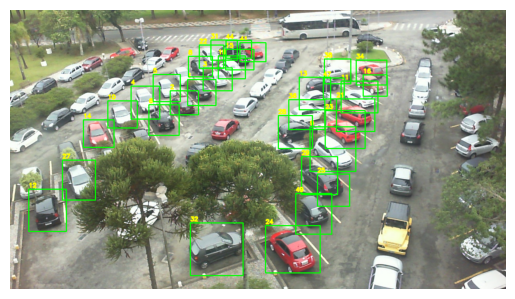

Number of parking spaces: 33
Number of empty spaces: 0
Number of occupied spaces: 33
Empty space IDs: []
Occupied space IDs: [1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16, 19, 21, 22, 23, 24, 25, 27, 28, 29, 31, 32, 34, 36, 38, 41, 44, 47, 49]


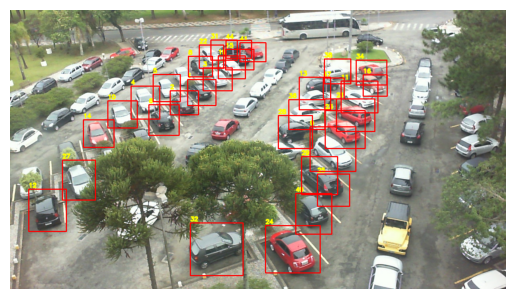

In [379]:
to_classify, image_with_boxes = crop_images1(image_path, updated_xml)
_, _, _, empty_space_ids, occupied_space_ids = ensemble_models(to_classify, model_paths)
visualize_results(image_path, xml_path, model_path)

# First steps with the cutting model in the process as well